In [1]:
from models.Detector import Detector
import os
from tqdm import tqdm
import pandas as pd
import random
from PIL import Image
import matplotlib.pyplot as plt
import cv2

weights_path = 'models/weights/'
path_to_images = '../dataset'

CONF_LEVEL = 0.05

classes_map = {
        "adj": 0,
        "int": 1,
        "geo": 2,
        "pro": 3,
        "non": 4,
    }

model = Detector(
    path_to_weights=weights_path, 
    path_to_tmp='./tmp_files', 
    weights_name='detector_weights_v2.pt', 
    confidence_level=CONF_LEVEL, 
    box_intersetor_flag=True,
    iou_treshold=0.65
)

In [2]:
def filter_condition(filename):
    return filename.endswith('.jpg') and filename.startswith('5 ')

image_paths = [os.path.join(path_to_images, filename) for filename in os.listdir(path_to_images) if filter_condition(filename)]

In [3]:
predicts = []
for img in tqdm(image_paths):
    predicts += model.predict([img])

100%|██████████| 224/224 [00:43<00:00,  5.11it/s]


In [4]:
dist = [0, 0, 0, 0, 0]
for item in predicts:
    for cls in item['names']:
        dist[classes_map[cls]]+=1

dist

[508, 38, 155, 34, 14]

type 5:

[393, 72, 198, 48, 51] -- ground true

In [5]:
def format_output(predicts):
    formated_predicts = {
            'filename' : [],
            'class_id' : [],
            'rel_x' : [],
            'rel_y' : [],
            'width' : [],
            'height' : []
        }

    classes_map = {
        "adj": 0,
        "int": 1,
        "geo": 2,
        "pro": 3,
        "non": 4,
    }
    
    for item in predicts:
        image_name = item['source_img_path'].split('/')[-1]
        for i, cls in enumerate(item['names']):
            parsed_coords = item['xywhn'].tolist()

            formated_predicts['filename'].append(image_name)
            formated_predicts['class_id'].append(classes_map[cls])
            formated_predicts['rel_x'].append(parsed_coords[i][0])
            formated_predicts['rel_y'].append(parsed_coords[i][1])
            formated_predicts['width'].append(parsed_coords[i][2])
            formated_predicts['height'].append(parsed_coords[i][3])
            
    return formated_predicts

In [6]:
# pd.DataFrame(format_output(predicts)).to_csv('submission.csv', index=False, sep=';')

In [7]:
def load_annotations(txt_file):
    annotations = []
    with open(txt_file, 'r') as file:
        for line in file:
            parts = line.strip().split()
            class_id = int(parts[0])
            rel_x = float(parts[1])
            rel_y = float(parts[2])
            width = float(parts[3])
            height = float(parts[4])
            annotations.append((class_id, rel_x, rel_y, width, height))
    return annotations

In [8]:
def draw_boxes(content):

    classes_map = {
        0: "adj",
        1: "int",
        2: "geo",
        3: "pro",
        4: "non"
    }

    img = content['image']
    annotations = content['annotations']
    
    img_height, img_width = img.shape[:2]
    
    for annotation in annotations:
        class_id, rel_x, rel_y, width, height = annotation
        # Преобразование относительных координат в абсолютные
        x_center = int(rel_x * img_width)
        y_center = int(rel_y * img_height)
        width = int(width * img_width)
        height = int(height * img_height)
        
        top_left_x = int(x_center - width / 2)
        top_left_y = int(y_center - height / 2)
        bottom_right_x = int(x_center + width / 2)
        bottom_right_y = int(y_center + height / 2)
        
        # Рисование прямоугольника и подпись
        cv2.rectangle(img, (top_left_x, top_left_y), (bottom_right_x, bottom_right_y), (0, 0, 0), 5)
        cv2.putText(img, str(classes_map[class_id]), (top_left_x, top_left_y - 10), cv2.FONT_HERSHEY_SIMPLEX, 5, (0, 0, 1), 6)
    
    # Отображение изображения с аннотациями
    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

../dataset/5 (37).jpg
../dataset/5 (164).jpg
../dataset/5 (60).jpg
../dataset/5 (133).jpg
../dataset/5 (76).jpg
../dataset/5 (99).jpg
../dataset/5 (125).jpg
../dataset/5 (21).jpg
../dataset/5 (172).jpg
../dataset/5 (109).jpg
../dataset/5 (220).jpg
../dataset/5 (148).jpg
../dataset/5 (8).jpg
../dataset/5 (187).jpg
../dataset/5 (168).jpg
../dataset/5 (216).jpg
../dataset/5 (83).jpg
../dataset/5 (200).jpg
../dataset/5 (129).jpg
../dataset/5 (95).jpg


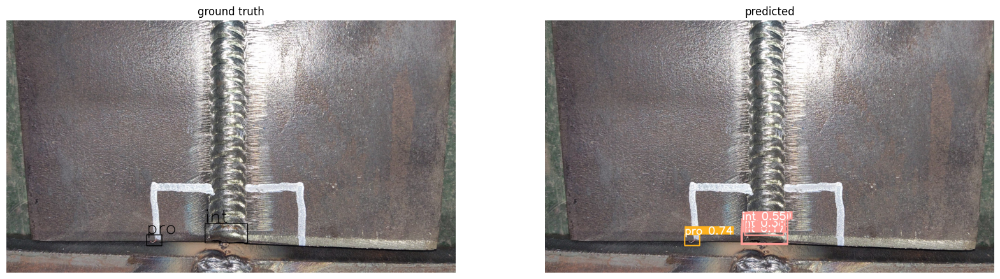

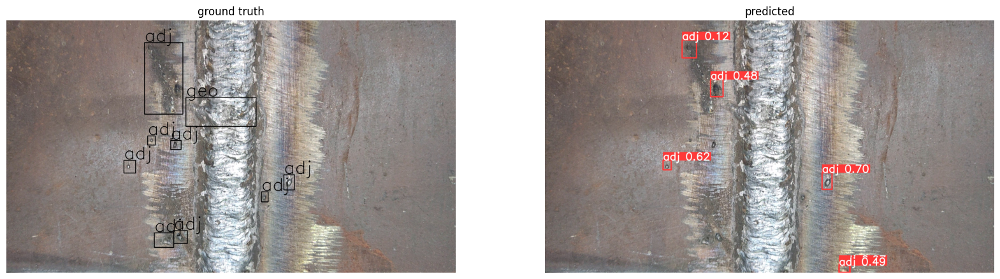

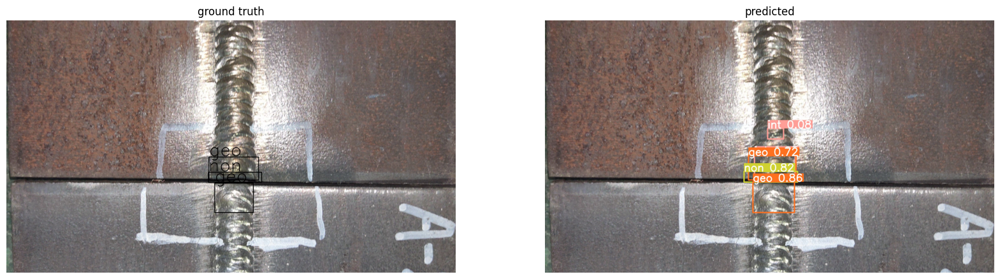

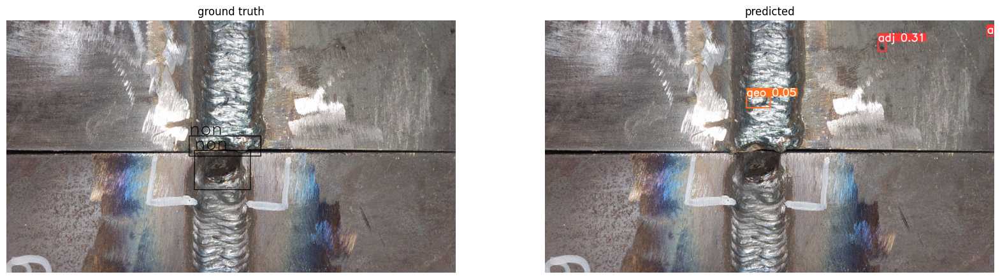

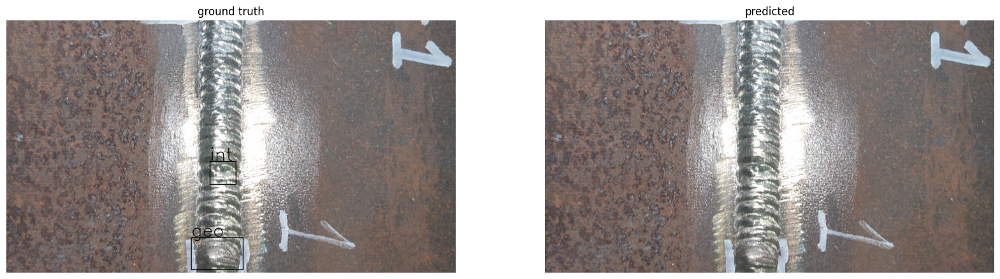

...

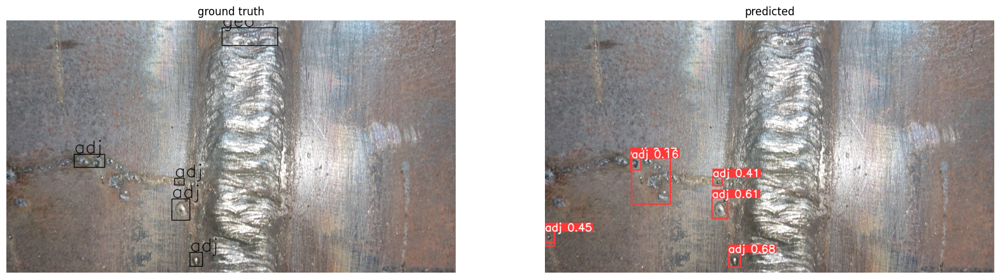

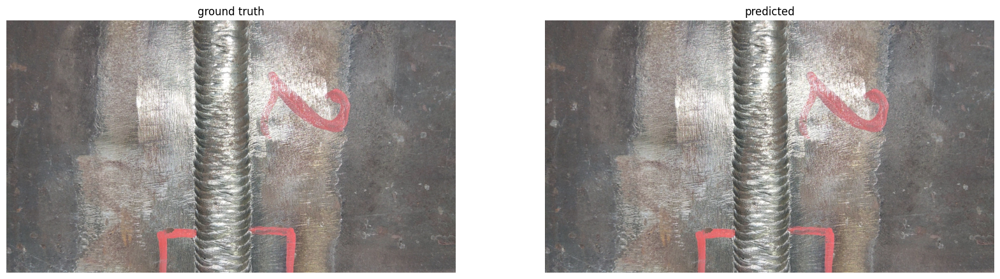

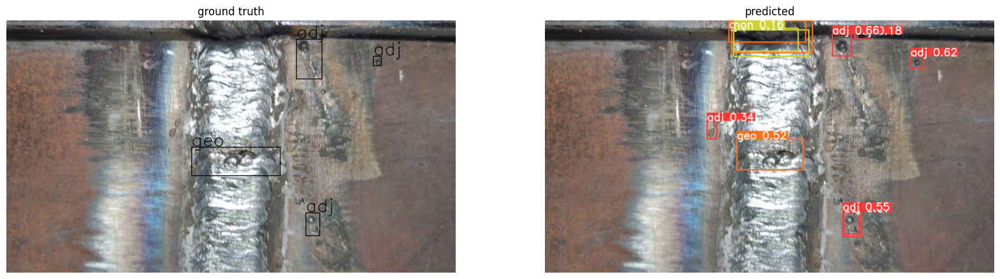

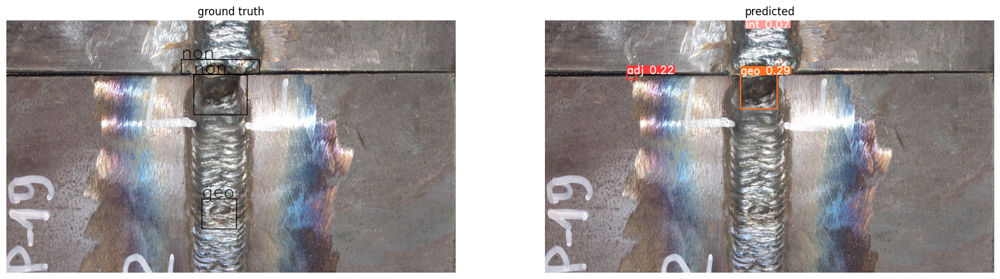

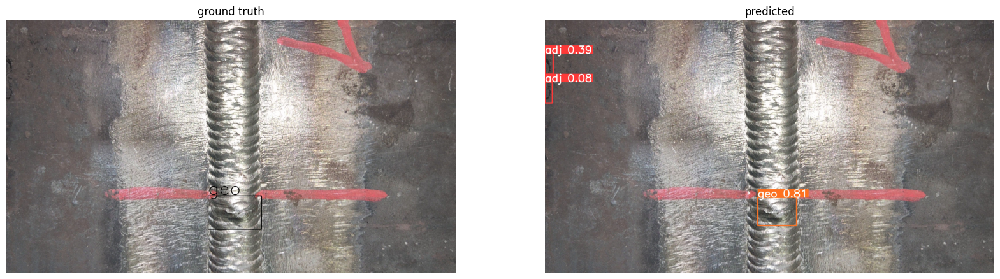

In [9]:
# random.shuffle(predicts)

COUNTER = 0

for item in predicts: 
    print(item['source_img_path'])
    image1 = cv2.imread(item['source_img_path'])
    
    txt_path = '..' + item['source_img_path'].split('.')[-2] + '.txt'
    annotations = load_annotations(txt_path)
    img_with_str = draw_boxes({'image': image1, 'annotations': annotations})

    cv2.imwrite('tmp.jpg', img_with_str)

    image2 = Image.open(item['predict_img_path'])

    fig, axes = plt.subplots(1, 2, figsize=(20, 10))

    axes[0].imshow(img_with_str)
    axes[0].axis('off')  
    axes[0].set_title('ground truth')

    axes[1].imshow(image2)
    axes[1].axis('off')
    axes[1].set_title('predicted')

    COUNTER += 1

    if COUNTER == 20:
        break
